In [1]:
import cv2
import matplotlib.pyplot as plt
import imutils
import numpy as np
import ntpath
import os

C:\Users\Maxim\AppData\Local\Temp/ipykernel_8740/1390708990.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20, 15))


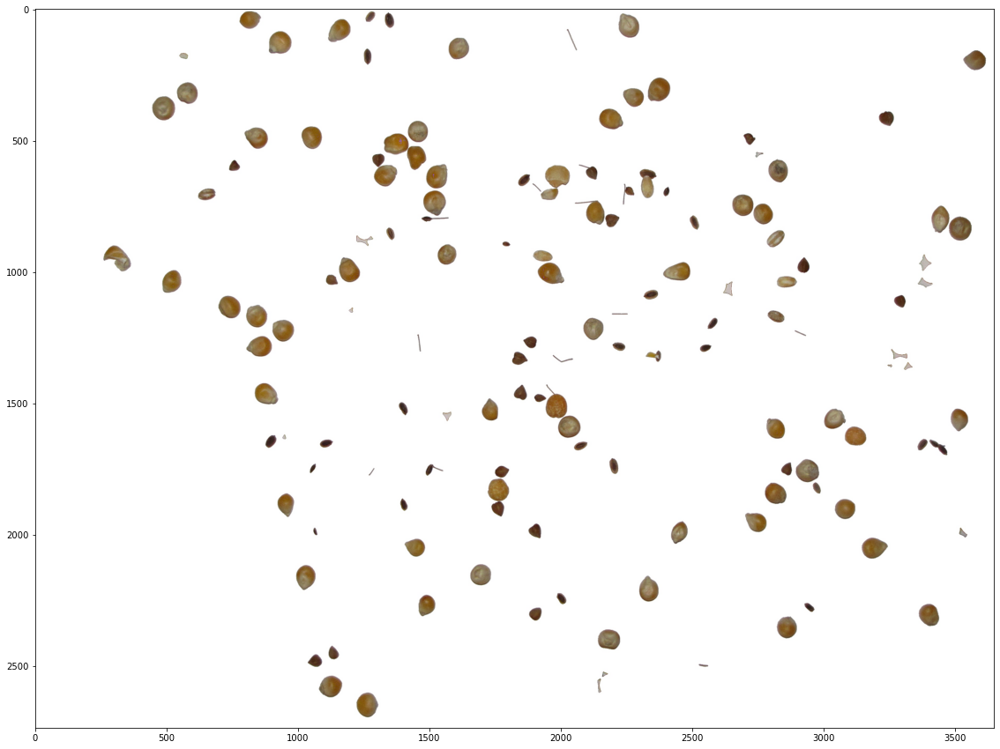

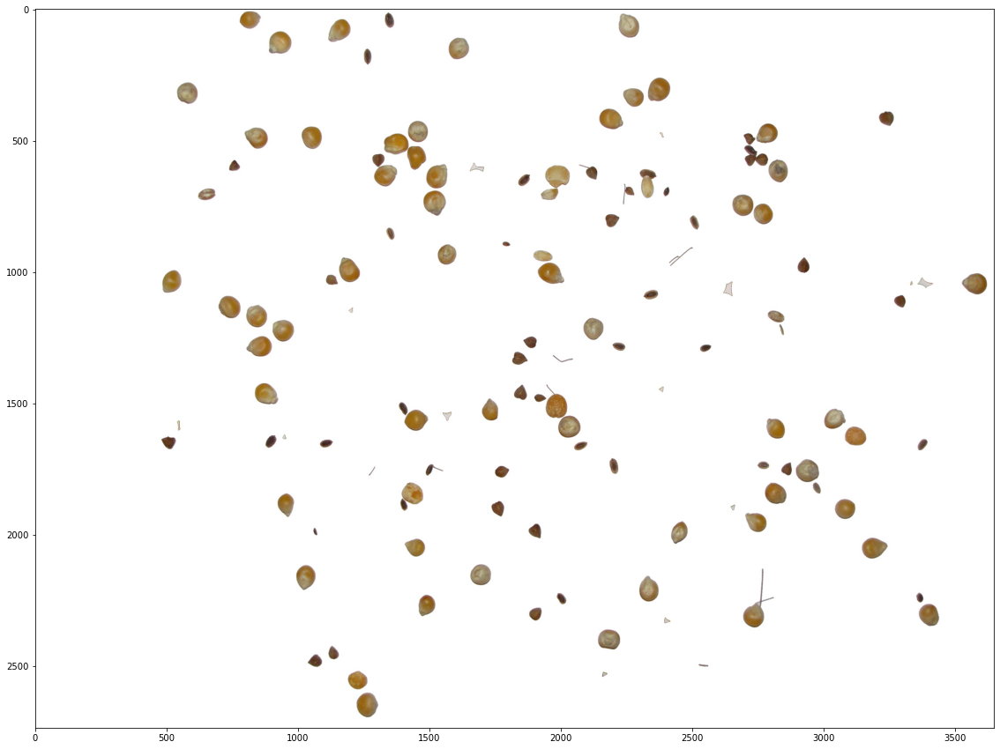

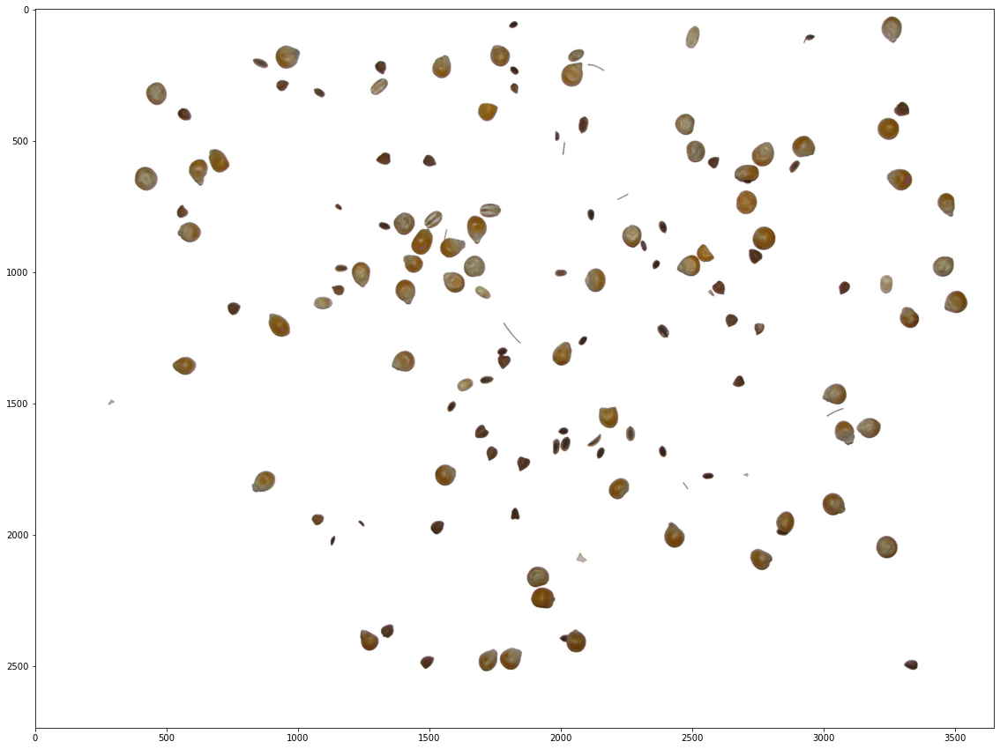

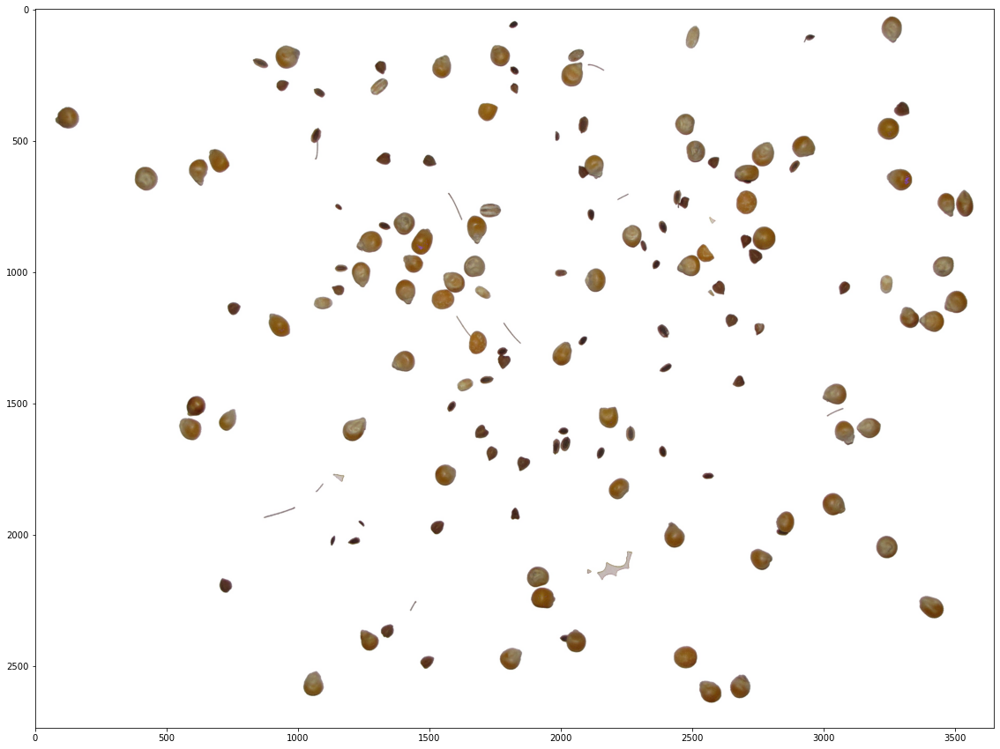

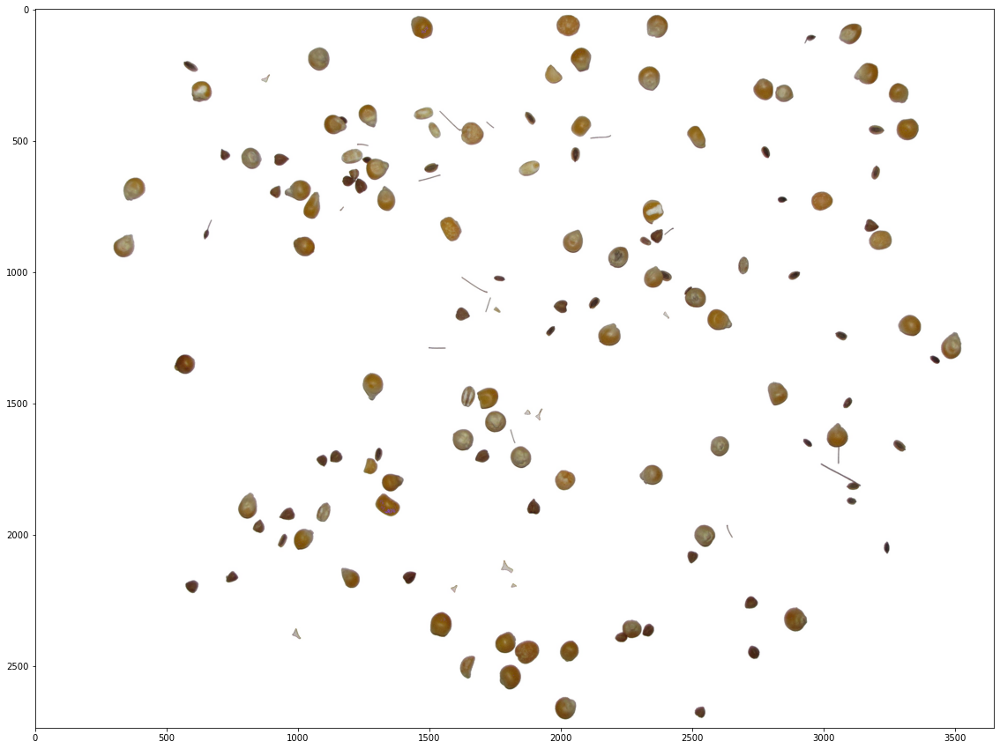

...

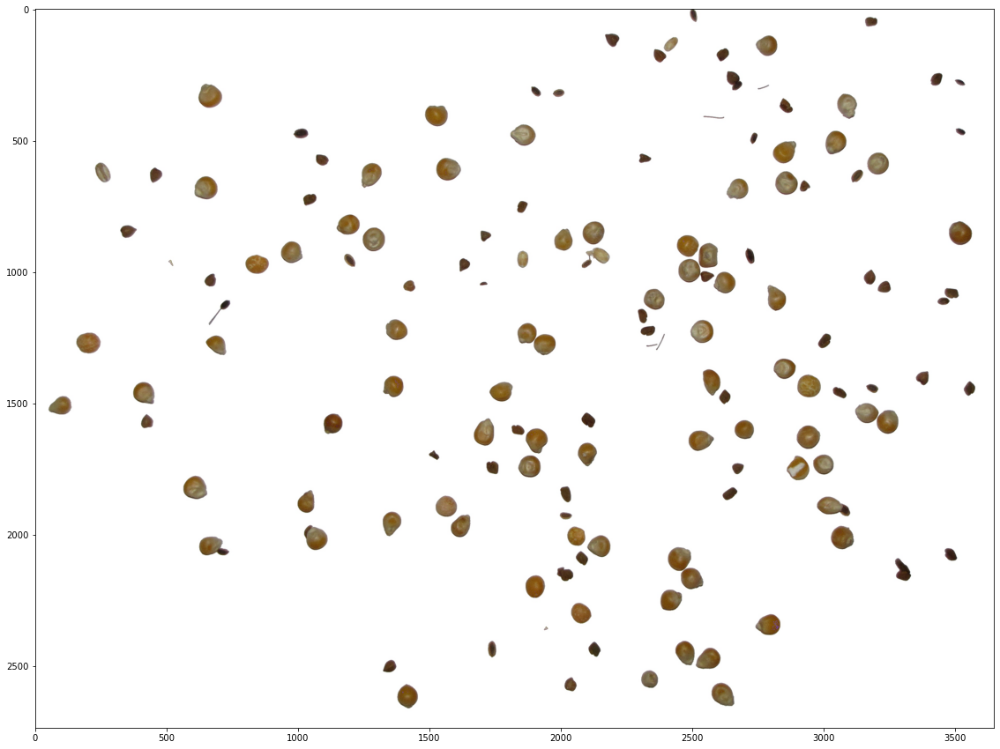

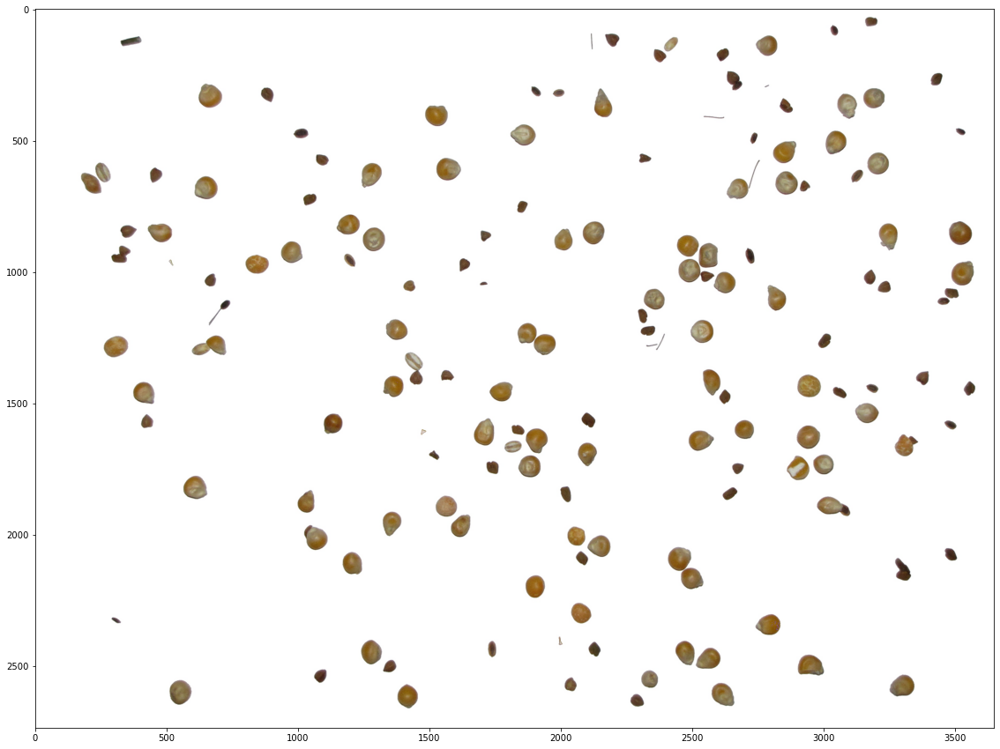

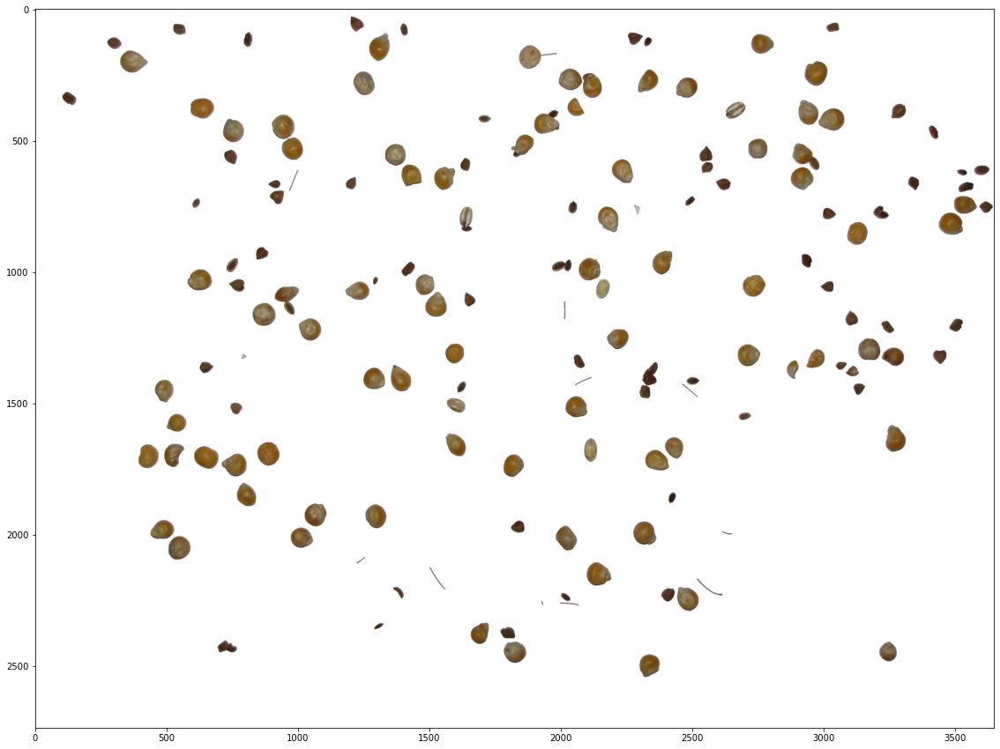

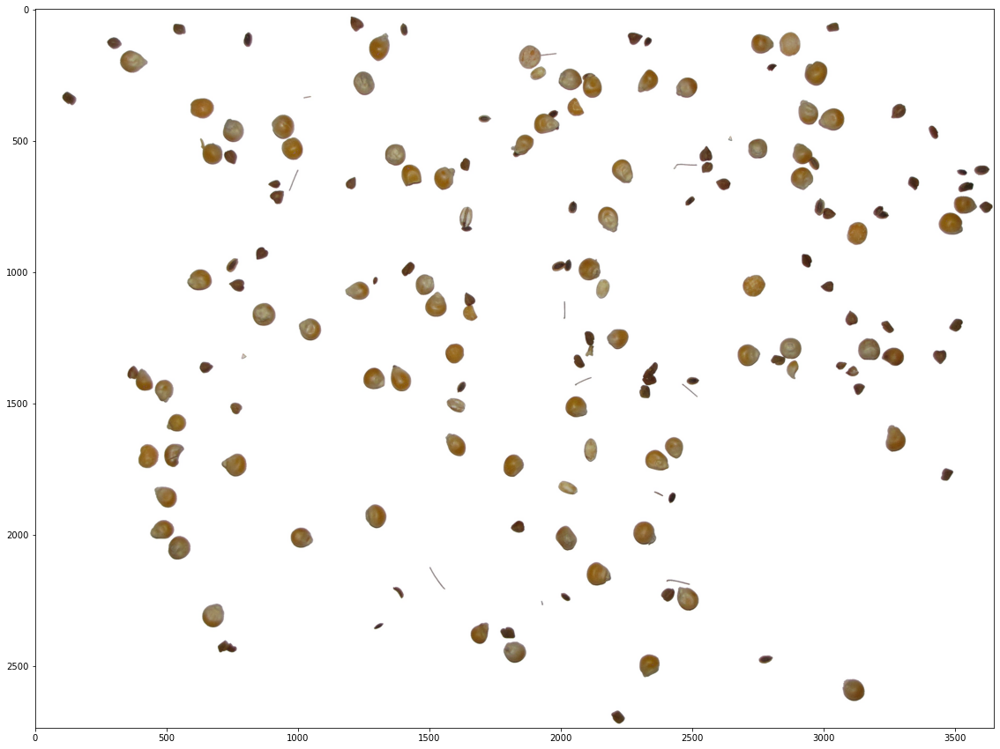

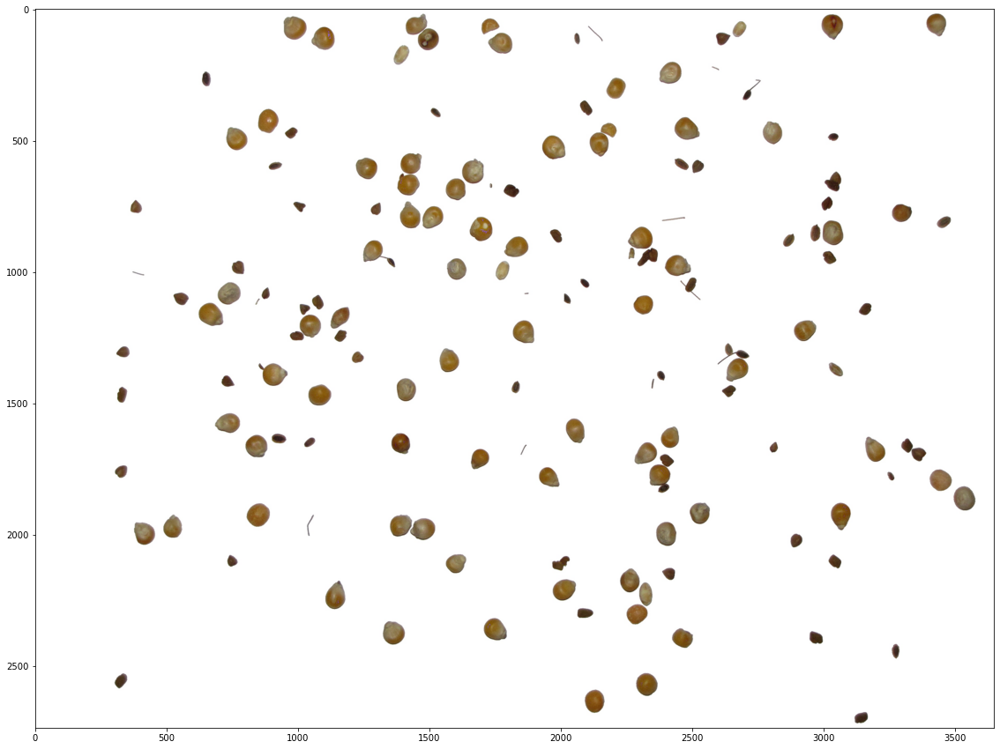

Error in callback <function flush_figures at 0x000001F4DD8F63A0> (for post_execute):


KeyboardInterrupt: 

In [174]:
for i in range(4310, 4331):
    img_path = f'D:/projects/CornClassifier/resources/IMG_{i}_wb.JPG'
    img2 = cv2.imread(img_path)
    plt.figure(figsize=(20, 15))
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))

In [159]:
def makeCanny(img, filt_args=(5, 7, 5)):
    b_filter = cv2.bilateralFilter(img, *filt_args)
    edges = cv2.Canny(b_filter, 50, 175)
    plt.figure(figsize=(15,20))
    plt.imshow(cv2.cvtColor(edges, cv2.COLOR_BGR2RGB))
    return edges
    

def showContours(edges, img_name):
    coord_bound_box = []
    count_of_contours = 0
    contours, hieract = cv2.findContours(edges.copy(), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_NONE)
    img_2 = img2.copy()
    empry_img = np.zeros(edges.shape, np.uint8)
    contours = sorted(contours, key=cv2.contourArea)
    suitable_contours = []
    for c, hier in zip(contours, hieract[0]):
        (x,y,w,h) = cv2.boundingRect(c)
        area = cv2.contourArea(c, True)
        arc_len = cv2.arcLength(c, True)
        if area < 6000 and (arc_len > 10 and abs(area > 3) and (w > 15 or h > 12)):
            coord_bound_box.append((x,y,w,h))
            count_of_contours += 1
#             cv2.rectangle(img_2, (x, y), (x + w, y + h), (255, 0, 0), 9)
            suitable_contours.append(c)
            cv2.drawContours(empry_img, c, -1, (255, 0, 0), 2)
            cv2.fillPoly(empry_img, pts =[c], color= 255)
    plt.figure(figsize=(15,20))
    print(f'number of counters: {count_of_contours}') 

    masked = cv2.bitwise_or(img_2, img_2, mask=empry_img)
    masked[masked == 0] = 255
#     plt.imshow(img_2)
    plt.imshow(cv2.cvtColor(masked, cv2.COLOR_BGR2RGB))
    cv2.imwrite(img_name.split('.')[0] + '_wb' + '.JPG', masked)
    return coord_bound_box
        
def MakeXMLFile(path: str, contours, class_name = 'mais'):
    margin_lvl = 0
    file_path, filename = ntpath.split(path)
    _, folder = ntpath.split(file_path)
    img = cv2.imread(path)
    height, width, depth = img.shape
    XMLfilename = filename.split('.')[0]
        
    with open(file_path + "/" + XMLfilename + '.xml', 'w') as f:
        f.write('<annotation>\n')
        margin_lvl += 1
        f.write('\t'*margin_lvl + f'<folder>{folder}</folder>\n')
        f.write('\t'*margin_lvl + f'<filename>{filename}</filename>\n')
        f.write('\t'*margin_lvl + f'<path>{path}</path>\n')
        f.write('\t'*margin_lvl + f'<source>\n')
        margin_lvl += 1 
        f.write('\t'*margin_lvl + '<database>Unknown</database>\n')
        margin_lvl -= 1
        f.write('\t'*margin_lvl + f'</source>\n')
        f.write('\t'*margin_lvl + '<size>\n')
        margin_lvl += 1
        f.write('\t'*margin_lvl + f'<width>{width}</width>\n')
        f.write('\t'*margin_lvl + f'<height>{height}</height>\n')
        f.write('\t'*margin_lvl + f'<depth>{depth}</depth>\n')
        margin_lvl -= 1
        f.write('\t'*margin_lvl + '</size>\n')
        f.write('\t'*margin_lvl + '<segmented>0</segmented>\n')
        
        for contour in contours:
            xmin, ymin, xmax, ymax = contour[0], contour[1], contour[0] + contour[2], contour[1] + contour[3]
            f.write('\t'*margin_lvl + '<object>\n')
            margin_lvl += 1
            f.write('\t'*margin_lvl + f'<name>{class_name}</name>\n')
            f.write('\t'*margin_lvl + f'<pose>Unspecified</pose>\n')
            f.write('\t'*margin_lvl + f'<truncated>0</truncated>\n')
            f.write('\t'*margin_lvl + f'<difficult>0</difficult>\n')
            f.write('\t'*margin_lvl + '<bndbox>\n')
            margin_lvl += 1
            f.write('\t'*margin_lvl + f'<xmin>{xmin}</xmin>\n')
            f.write('\t'*margin_lvl + f'<ymin>{ymin}</ymin>\n')
            f.write('\t'*margin_lvl + f'<xmax>{xmax}</xmax>\n')
            f.write('\t'*margin_lvl + f'<ymax>{ymax}</ymax>\n')
            margin_lvl -= 1
            f.write('\t'*margin_lvl + '</bndbox>\n')
            margin_lvl -= 1
            f.write('\t'*margin_lvl + '</object>\n')
        
        f.write('</annotation>')

(2736, 3648, 3)


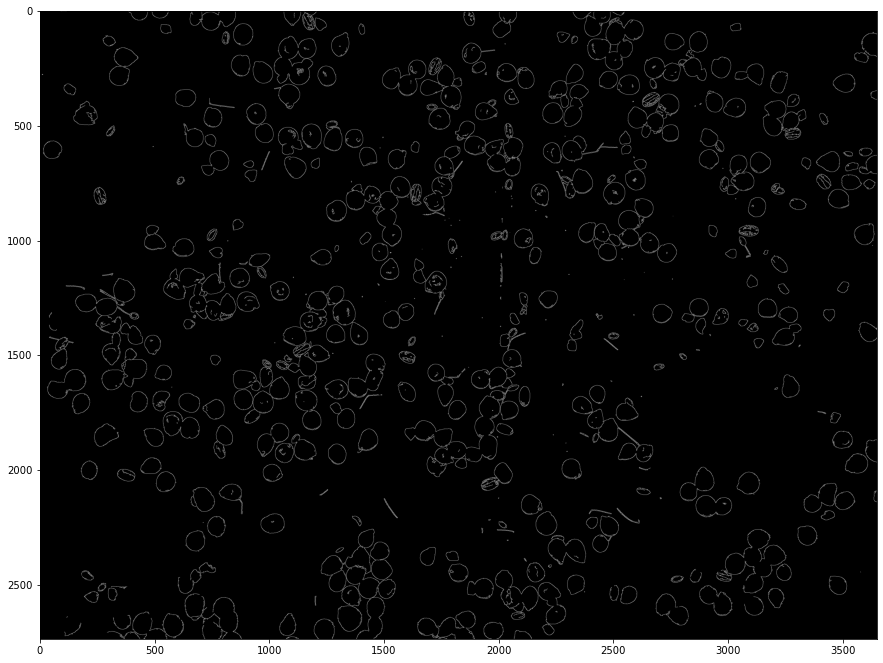

In [160]:
img2 = cv2.imread('D:/projects/CornClassifier/resources/IMG_4324.JPG')
img = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
print(img2.shape)
edges = makeCanny(img)

number of counters: 138


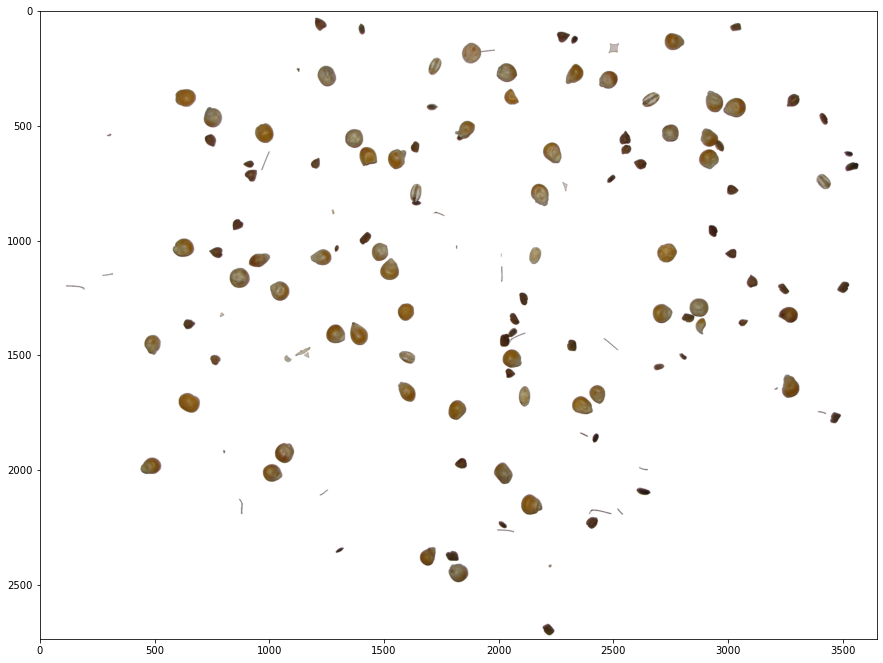

In [161]:
coords = showContours(edges,'D:/projects/CornClassifier/resources/IMG_4324.JPG')
MakeXMLFile(path='D:/projects/CornClassifier/resources/IMG_4324.JPG', contours=coords)

number of counters: 142
number of counters: 128
number of counters: 135
number of counters: 148
number of counters: 142
number of counters: 128
number of counters: 137
number of counters: 143
number of counters: 167
number of counters: 181


C:\Users\Maxim\AppData\Local\Temp/ipykernel_8740/3837368824.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,20))


number of counters: 188
number of counters: 194
number of counters: 144
number of counters: 157
number of counters: 157
number of counters: 160
number of counters: 151
number of counters: 167
number of counters: 145
number of counters: 156
number of counters: 165


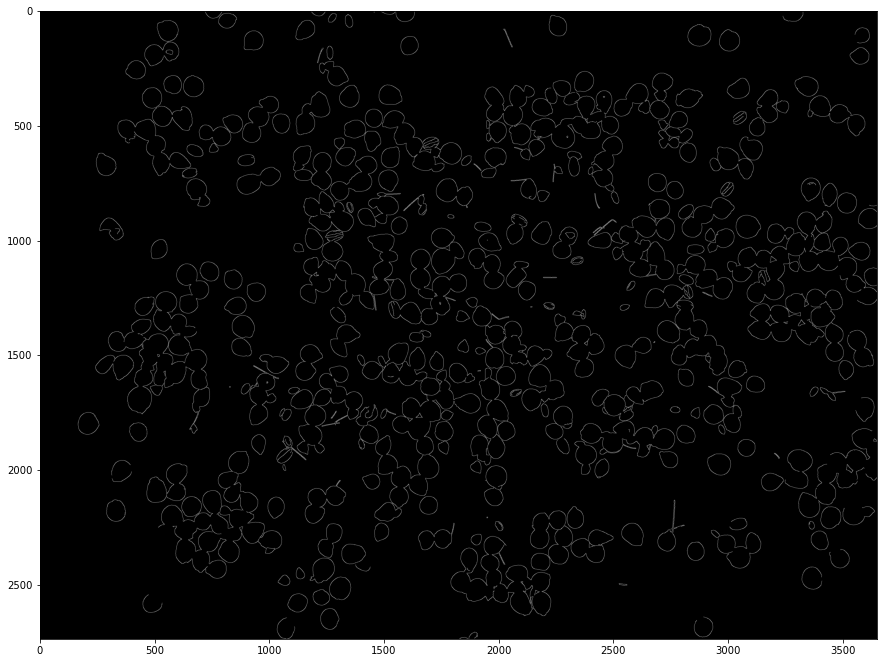

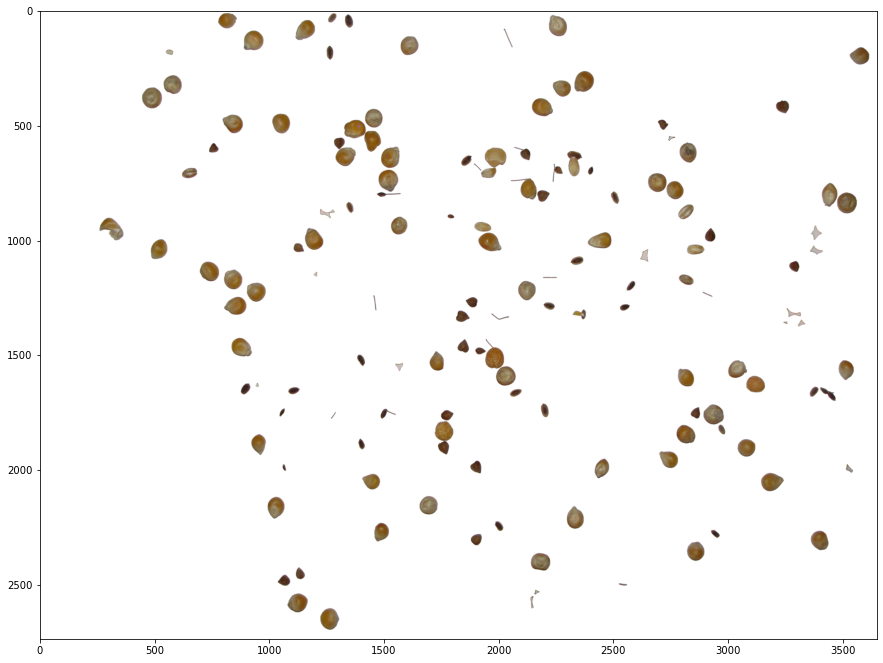

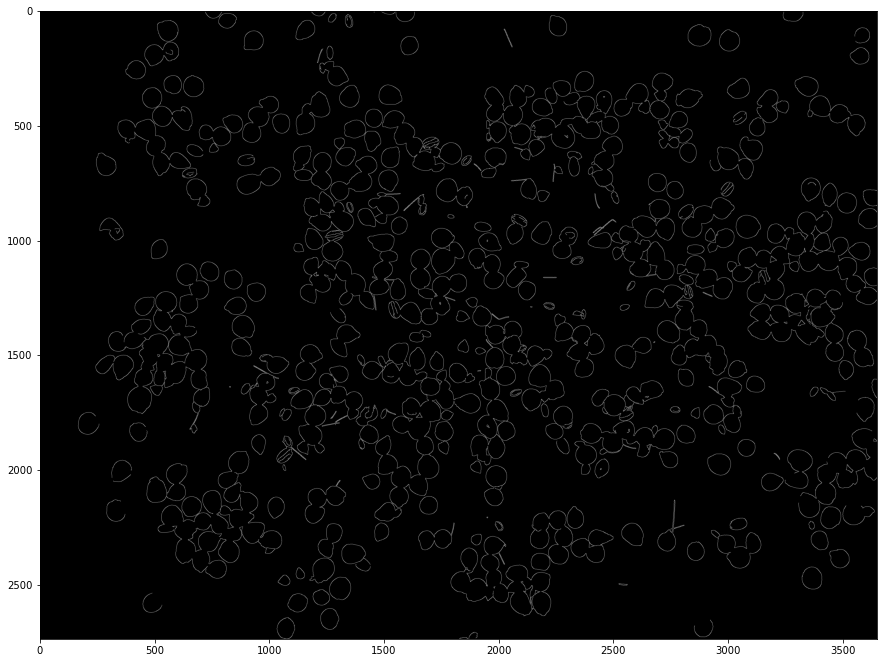

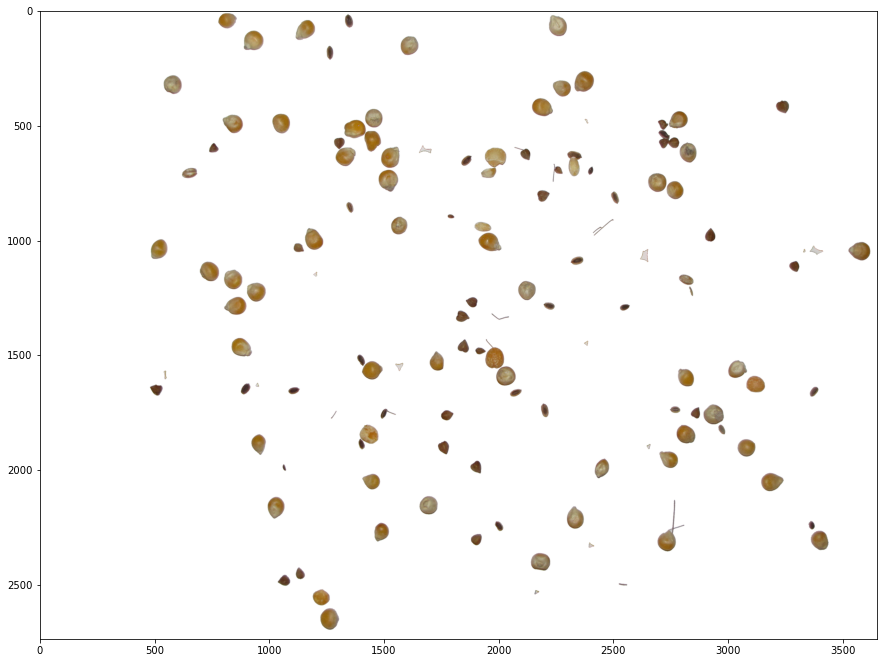

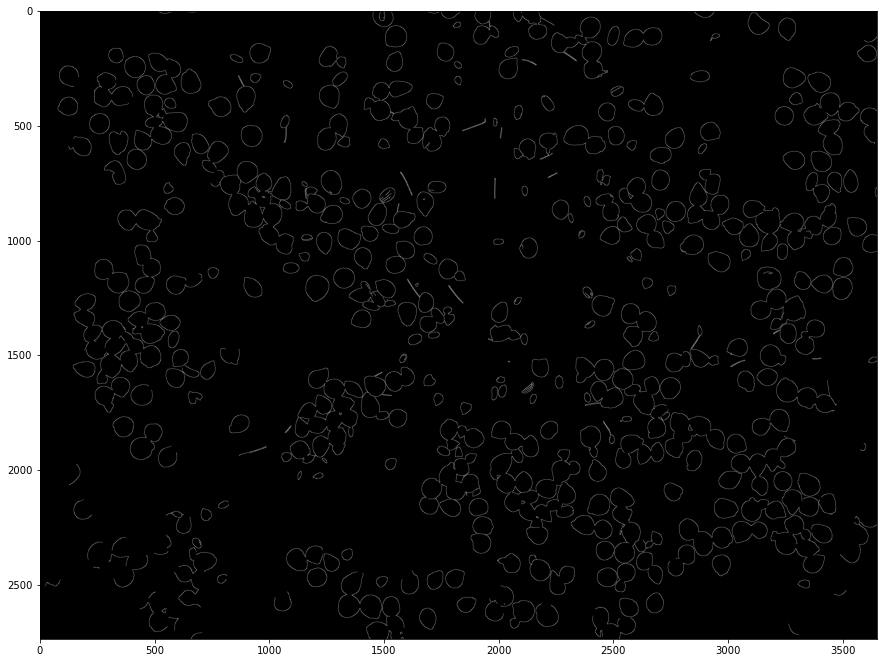

...

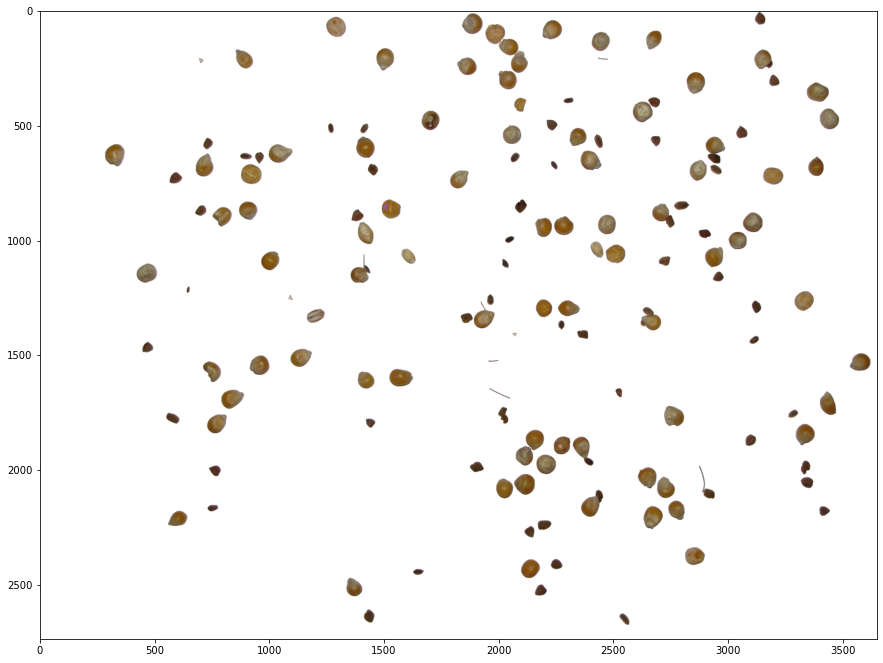

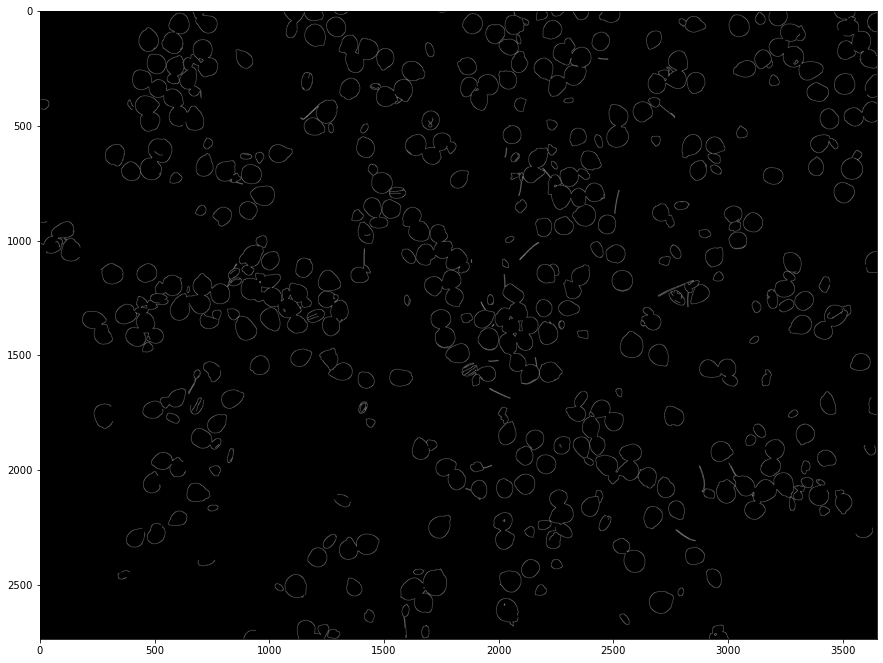

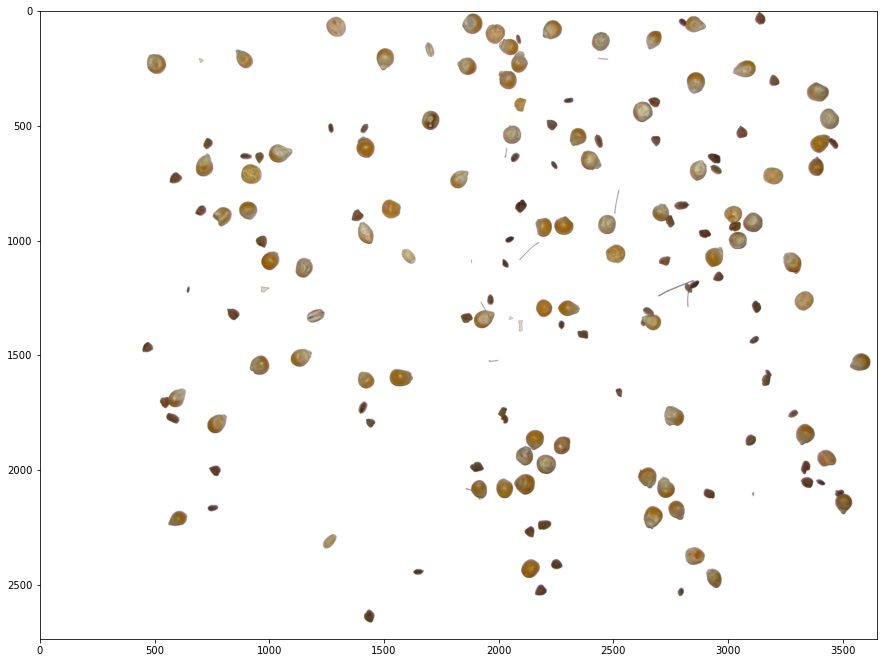

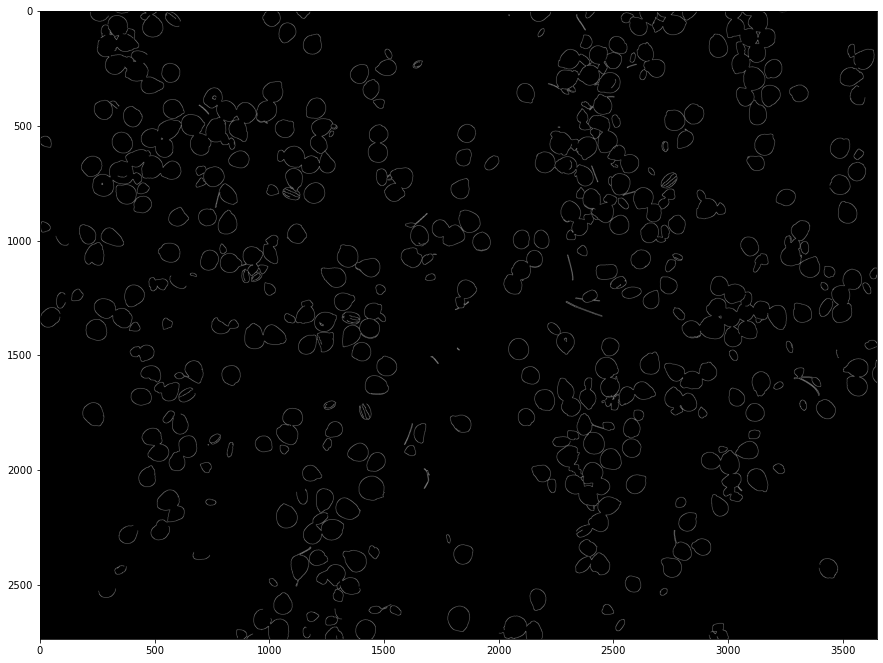

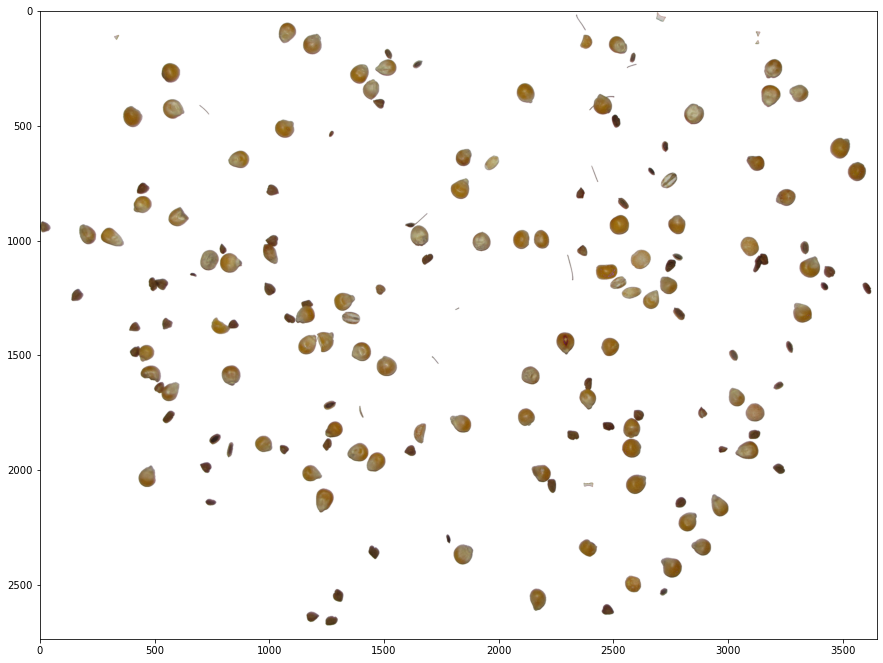

In [175]:
for i in range(4310, 4331):
    img_path = f'D:/projects/CornClassifier/resources/IMG_{i}.JPG'
    img2 = cv2.imread(img_path)
    img = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    edges = makeCanny(img, (10, 35, 35))
    coords = showContours(edges, img_path)
    MakeXMLFile(img_path.split('.')[0] + '_wb' + '.JPG', coords)

number of counters: 142


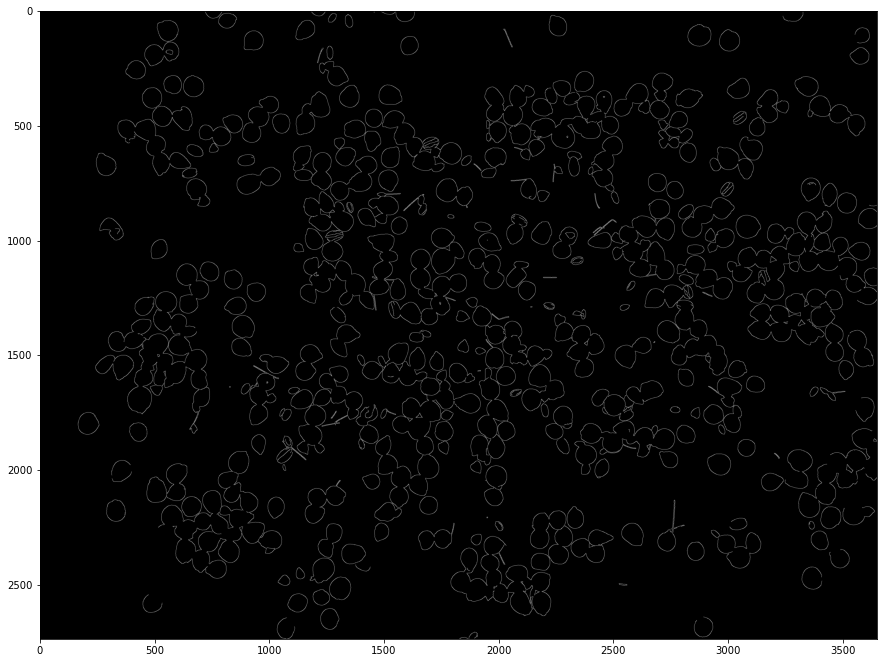

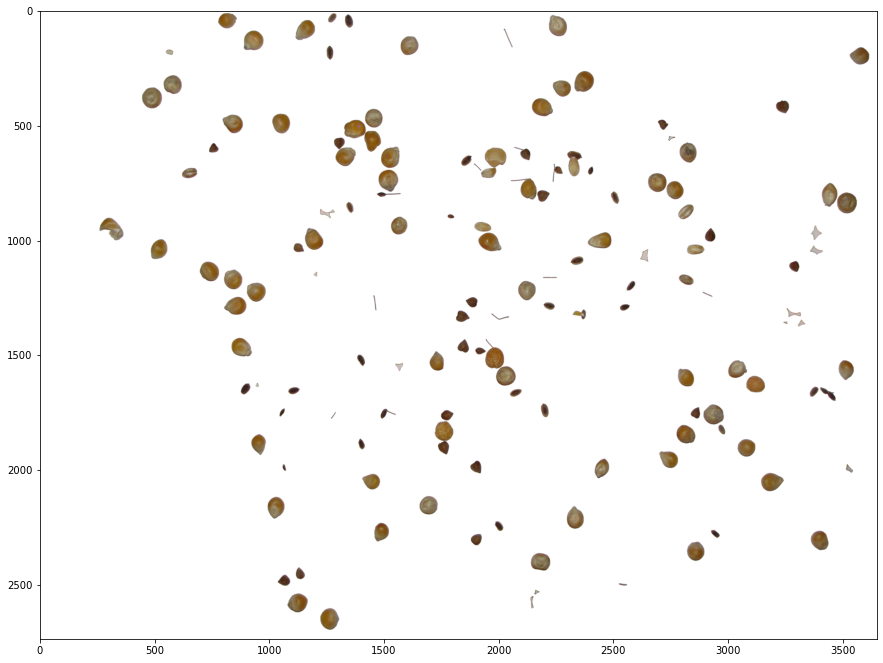

In [432]:
edge = makeCanny(img, (10, 35, 35))
showContours(edge)

Теперь надо проверить что все классы размеченны верно:

In [2]:
import xml.etree.ElementTree as ET

In [89]:
img = cv2.imread('D:/projects/CornClassifier/resources/IMG_4330_wb.jpg')

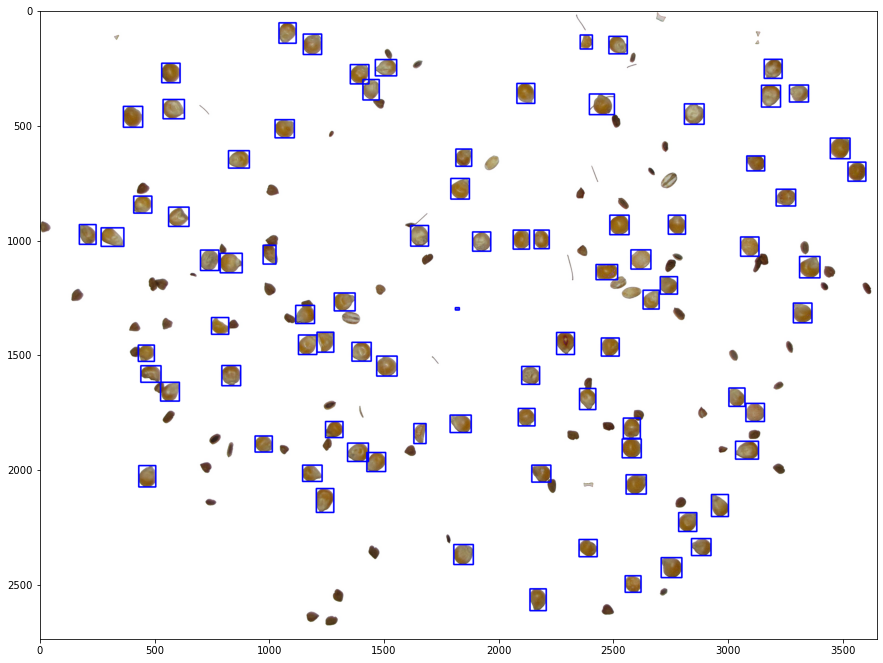

In [94]:
tree = ET.parse('D:/projects/CornClassifier/resources/IMG_4330_wb.xml')
root = tree.getroot()
img2 = img.copy()
for class_name, xmin, ymin, xmax, ymax in zip(root.findall('.//name'), root.findall('.//xmin'),  root.findall('.//ymin'), \
                            root.findall('.//xmax'), root.findall('.//ymax') ):
    if class_name.text == 'mais':
        cv2.rectangle(img2, (int(xmin.text), int(ymin.text)), (int(xmax.text), int(ymax.text)), (255, 0, 0), 5)
plt.figure(figsize=(15, 20))
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))